<a href="https://colab.research.google.com/github/noam812/deep-learning-project/blob/main/end_to_end_deep_learnign_project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
##!unzip '/content/drive/MyDrive/dog_vision/dog-breed-identification' -d '/content/drive/MyDrive/dog_vision'


Streaming output truncated to the last 5000 lines.
  inflating: /content/drive/MyDrive/dog_vision/train/83bc62b0fffa99a9c94ba0b67a5f7395.jpg  
  inflating: /content/drive/MyDrive/dog_vision/train/83bcff6b55ee179a7c123fa6103c377a.jpg  
  inflating: /content/drive/MyDrive/dog_vision/train/83be6d622ab74a5e7e08b53eb8fd566a.jpg  
  inflating: /content/drive/MyDrive/dog_vision/train/83c2d7419b0429b9fe953bc1b6cddbec.jpg  
  inflating: /content/drive/MyDrive/dog_vision/train/83cf7d7cd2a759a93e2ffd95bea9c6fb.jpg  
  inflating: /content/drive/MyDrive/dog_vision/train/83d405858f0931722ef21e8ac0adee4d.jpg  
  inflating: /content/drive/MyDrive/dog_vision/train/83d4125a4c3c7dc5956563276cb1cd74.jpg  
  inflating: /content/drive/MyDrive/dog_vision/train/83f0bb565b2186dbcc6a9d009cb26ff2.jpg  
  inflating: /content/drive/MyDrive/dog_vision/train/83fad0718581a696132c96c166472627.jpg  
  inflating: /content/drive/MyDrive/dog_vision/train/83fbbcc9a612e3f712b1ba199da61f20.jpg  
  inflating: /content/drive/M

# End-to-end multi dog breed identifier

# . Problem
identifying dog breed - e.g taking a puicture of a dog and being able to know the breed

# 2. Data

The data we're using is from Kaggle

# 3. evaluation  -

The Evaluation is a file with predictions probabilities for each dog breed

# 4. Features

Some info about the data
* We're dealing with images - unstructured
* There are 120 breeds of dogs - meaning 120 classes
3* There are aroung 10K ungs fir test and train sets



In [ ]:
# import neccesary tools
import tensorflow as tf
import tensorflow_hub as hub

print("TensorFlow version",tf.__version__)
print("TensorFlow Hub version",hub.__version__)



TensorFlow version 2.15.0
TensorFlow Hub version 0.16.1


In [ ]:
# check if gpu is available

print("GPU", "available" if tf.config.list_physical_devices("GPU") else "not available")

GPU available


In [ ]:
# prompt: add labels.csv from drive as a pandas DF

import pandas as pd

# Change the path to reflect the actual location of the labels.csv file on your Google Drive.
df_labels = pd.read_csv('/content/drive/MyDrive/dog_vision/labels.csv')

# Print the DataFrame
print(df_labels)



                                     id                     breed
0      000bec180eb18c7604dcecc8fe0dba07               boston_bull
1      001513dfcb2ffafc82cccf4d8bbaba97                     dingo
2      001cdf01b096e06d78e9e5112d419397                  pekinese
3      00214f311d5d2247d5dfe4fe24b2303d                  bluetick
4      0021f9ceb3235effd7fcde7f7538ed62          golden_retriever
...                                 ...                       ...
10217  ffd25009d635cfd16e793503ac5edef0                    borzoi
10218  ffd3f636f7f379c51ba3648a9ff8254f            dandie_dinmont
10219  ffe2ca6c940cddfee68fa3cc6c63213f                  airedale
10220  ffe5f6d8e2bff356e9482a80a6e29aac        miniature_pinscher
10221  fff43b07992508bc822f33d8ffd902ae  chesapeake_bay_retriever

[10222 rows x 2 columns]


In [ ]:
print(f'Shape :"{df_labels.shape}')
print(f' Description :{df_labels.describe}')

Shape :"(10222, 2)
 Description :<bound method NDFrame.describe of                                      id                     breed
0      000bec180eb18c7604dcecc8fe0dba07               boston_bull
1      001513dfcb2ffafc82cccf4d8bbaba97                     dingo
2      001cdf01b096e06d78e9e5112d419397                  pekinese
3      00214f311d5d2247d5dfe4fe24b2303d                  bluetick
4      0021f9ceb3235effd7fcde7f7538ed62          golden_retriever
...                                 ...                       ...
10217  ffd25009d635cfd16e793503ac5edef0                    borzoi
10218  ffd3f636f7f379c51ba3648a9ff8254f            dandie_dinmont
10219  ffe2ca6c940cddfee68fa3cc6c63213f                  airedale
10220  ffe5f6d8e2bff356e9482a80a6e29aac        miniature_pinscher
10221  fff43b07992508bc822f33d8ffd902ae  chesapeake_bay_retriever

[10222 rows x 2 columns]>


In [ ]:
df_labels.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: xlabel='breed'>

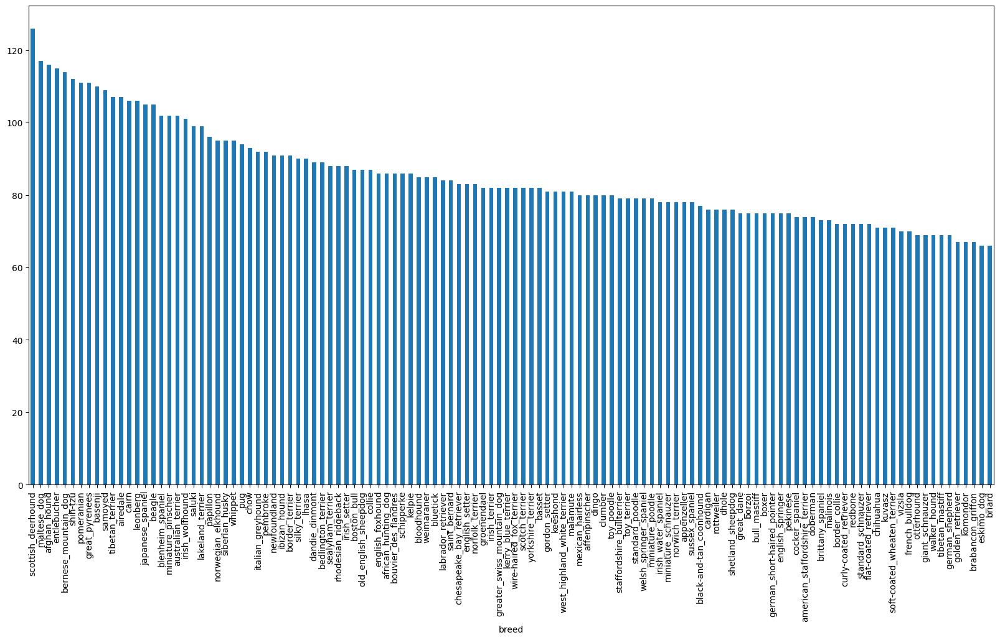

In [ ]:
# How many images fro each breed

df_labels['breed'].value_counts().plot.bar(figsize=(20,10))

In [ ]:
# avg for breeds
df_labels['breed'].value_counts().median()

82.0

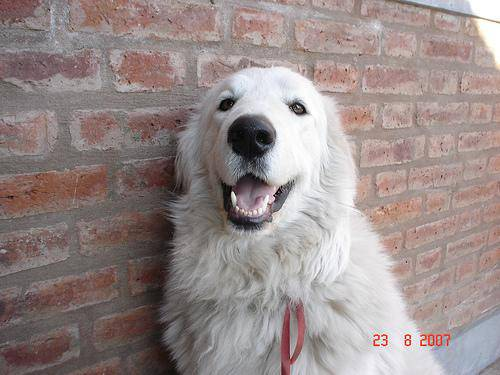

In [ ]:
# lets view the image
from IPython.display import Image
Image('/content/drive/MyDrive/dog_vision/train/0a0c223352985ec154fd604d7ddceabd.jpg')


In [ ]:
#Getting images and labels

#create pathnames from image id's
filenames = ['/content/drive/MyDrive/dog_vision/train/' + fname for fname in df_labels['id']+ '.jpg']

filenames[:10]



['/content/drive/MyDrive/dog_vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/dog_vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/dog_vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/dog_vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/dog_vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/dog_vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/dog_vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/dog_vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/dog_vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/dog_vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# compare instances amount
import os
if len(os.listdir('/content/drive/MyDrive/dog_vision/train')) == len(filenames):
  print('Filenames match')
else:
    print('Filenames do not match')
len(filenames), len(df_labels)

Filenames match


(10222, 10222)

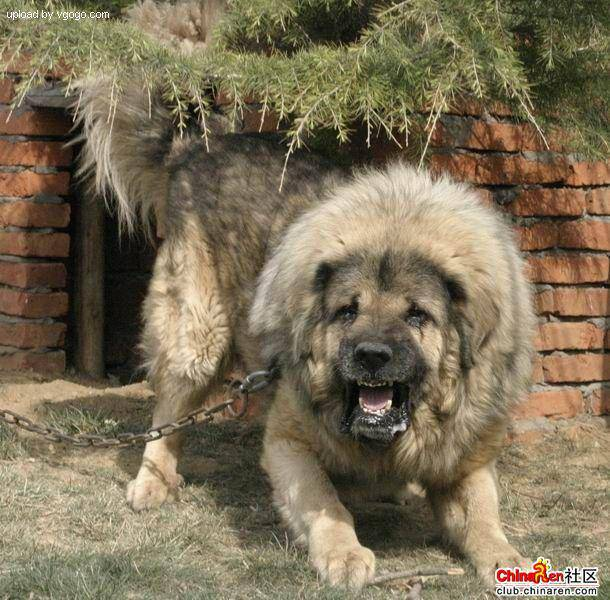

In [ ]:
# Another check
Image(filenames[9000])



In [ ]:
# turning our labels to numbers
import numpy as np

# df_labels['breed_id'] = df_labels['breed'].astype('category').cat.codes
# df_labels.head()
labels =  df_labels['breed'].to_numpy()
labels[:5]



array(['boston_bull', 'dingo', 'pekinese', 'bluetick', 'golden_retriever'],
      dtype=object)

In [ ]:
unique_breeds = np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
#turn a single label into array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# turn every label
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:5]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
# Check

print(labels[0]) ## original label
print(np.where(unique_breeds == labels[0])) ## label index
print(boolean_labels[0].argmax()) ## index where label occurs in bool array
print(boolean_labels[0].astype(int)) ## index where label occurs in bool array

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
#setup x &y var
X = filenames
y = boolean_labels



In [ ]:
# set number of images to use for experiment

NUM_IMAGES = 1000 # @param {type:"slider", min:1000, max:10000, step:1000}

In [ ]:
# split data train an validation

from sklearn.model_selection import train_test_split

X_train, X_valid, y_train, y_valid = train_test_split(X[:NUM_IMAGES], y[:NUM_IMAGES], test_size=0.2, random_state=42)

len(X_train), len(X_valid), len(y_train), len(y_valid)

(800, 200, 800, 200)

In [ ]:
X_train[:2], y_train[:2]


(['/content/drive/MyDrive/dog_vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  '/content/drive/MyDrive/dog_vision/train/0d2f9e12a2611d911d91a339074c8154.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False,

In [ ]:
# Preprocessing images (unto tensors)
'''
Well create a function that :
1.take a image filepath as input
2. Use TF ti reead the file a save it to a var
3. turn the image into tensors ( a numericle representation of the image)
4. resize the image to (224,224)
5. return the image as a tensor
'''

def preprocess_image(filepath):
  # read image
  image = tf.io.read_file(filepath)

  #turn to tensor
  image = tf.image.decode_jpeg(image, channels=3)
  ## change values to be between 0-1
  image = tf.image.convert_image_dtype(image, tf.float32)


  #resize
  image = tf.image.resize(image, (224,224))

  return image






In [ ]:
# batch the data
# create a functiuon that return a tuple (image. label)

def get_image_label(image_path, label):
  image = preprocess_image(image_path)
  return image, label





In [ ]:
#Demo for the above'


(get_image_label(X[42], y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

In [ ]:
BATCH_SIZE = 32

def create_data_batches(x, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  '''
  create batches of data out of image (x) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  '''
  # if the data is test data  - we wont have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x))) # only filepaths
    data_batch = data.map(preprocess_image).batch(BATCH_SIZE)
    return data_batch

  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), tf.constant(y))) # filepaths & labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch


  else:
    print("Creating training data batches...")
    # we want to shuffle the data
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), tf.constant(y))) # filepaths & labels
    data = data.shuffle(buffer_size=len(x)) # shuffle the data
    data = data.map(get_image_label) # turn the data into batches
    data_batch = data.batch(BATCH_SIZE)

    # return the batch
  return data_batch



In [ ]:
train_data = create_data_batches(X_train, y_train)
valid_data = create_data_batches(X_valid, y_valid, valid_data=True)


Creating training data batches...
Creating validation data batches...


In [ ]:
# check the difference
train_data.element_spec, valid_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

In [ ]:
# lets visualize the batches -
import matplotlib.pyplot as plt

def show_25_images(images, labels):
  '''
  Display 25 images from a batch

  '''
  #setup the figure
  plt.figure(figsize=(10,10))
  #loop through 25
  for i in range(25):
    ax = plt.subplot(5,5,i+1)
    # Display
    plt.imshow(images[i])
    # Add title
    plt.title(unique_breeds[labels[i].argmax()])
    # turn off
    plt.axis('off')



In [ ]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())
train_images.shape, train_labels.shape

((32, 224, 224, 3), (32, 120))

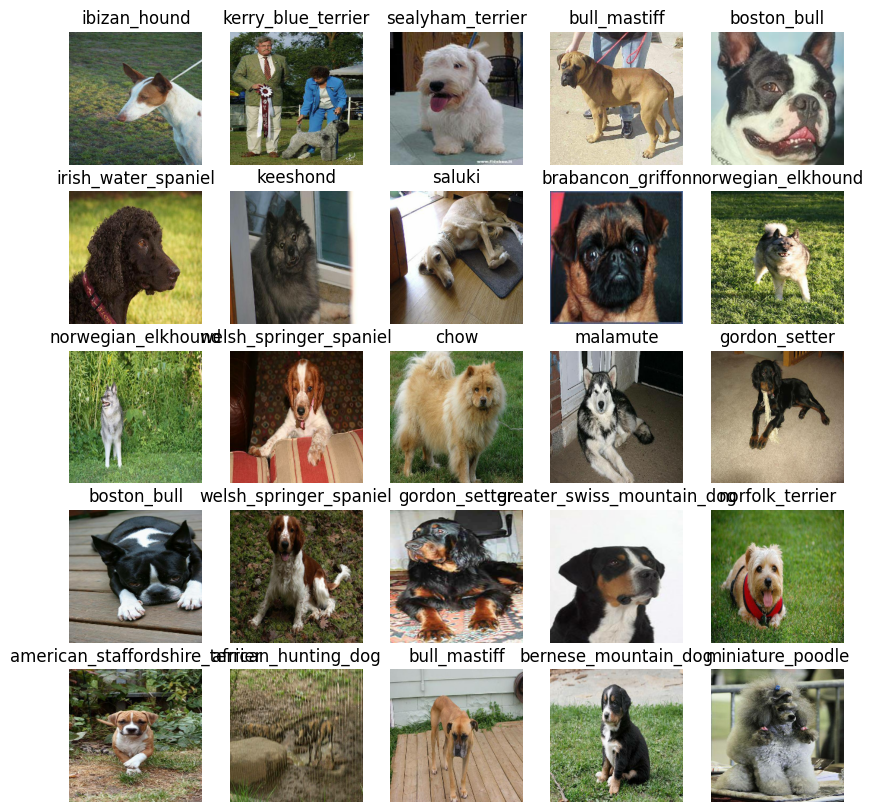

In [ ]:
# Visualise the data in a training batch
show_25_images(train_images, train_labels)

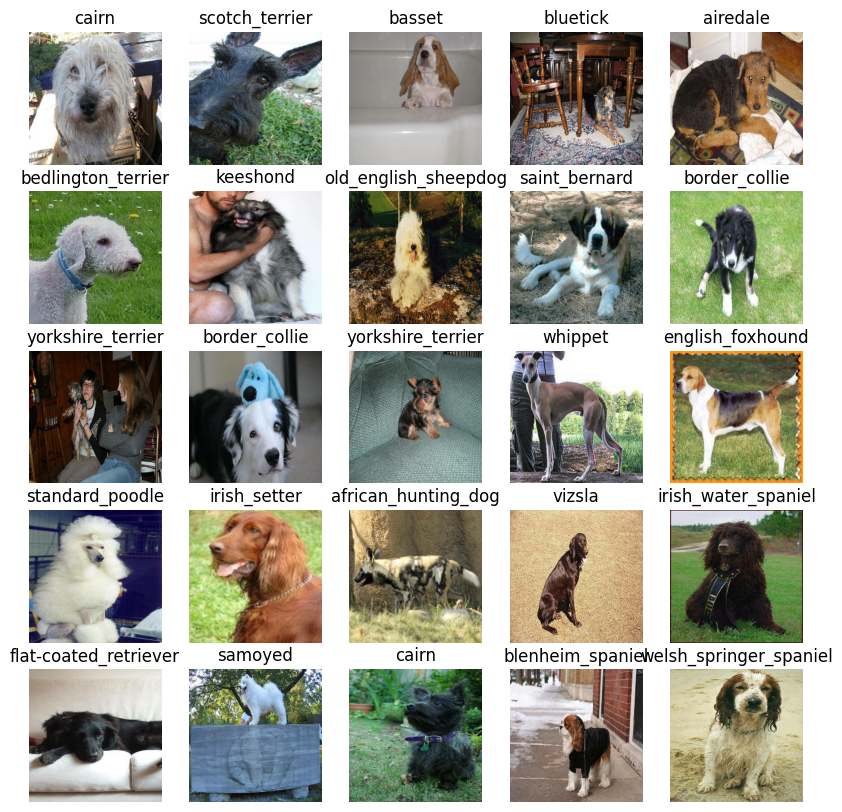

In [ ]:
# Visualize valid data
valid_images, valid_labels = next(valid_data.as_numpy_iterator())
show_25_images(valid_images, valid_labels)


In [ ]:
'''
Building a model

Before we build a model, there are a few things we need to define
1. Input shape
2. Output shape
3. URL Model to use
'''

# Setup input shape
INPUT_SHAPE = [None, 224, 224, 3] # batch, height, width, colour channels

#Setup output shape
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL
MODEL_URL = "https://www.kaggle.com/models/google/mobilenet-v3/TensorFlow2/large-075-224-classification/1"






In [ ]:
# create a funcdtion that build a keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  # Download the pretrained model and save it as a Keras layer
  hub_layer = hub.KerasLayer(MODEL_URL)

  # Create model
  model = tf.keras.Sequential([
    hub_layer,
    tf.keras.layers.Dense(OUTPUT_SHAPE, activation='softmax')
  ])

  #compile the model
  model.compile(
      loss = tf.keras.losses.CategoricalCrossentropy(),
      optimizer = tf.keras.optimizers.Adam(),
      metrics = ['accuracy']
  )

  # build the model
  model.build(INPUT_SHAPE)

  return model



In [ ]:
model = create_model()
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              4013897   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 4134137 (15.77 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 4013897 (15.31 MB)
_________________________________________________________________


In [ ]:
## Create Callbacks

# TensorBoard callback

%load_ext tensorboard


The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [ ]:
import datetime
import os

# create a function to build callback
def create_tensorboard_callback():
  # Create a log directory to set up
  logdir = os.path.join("drive/MyDrive/dog_vision/logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

#

In [ ]:
# create early stop function
early_stop = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=3)


In [ ]:
## Training a model (on a subset of data)
# first  model will be trained only on 1000 images for testing porpouses
NUM_EPOCHS = 100 # @param {type:"slider", min:10, max:100, step:10}
# Fit the model to the data passing it


In [ ]:
print("GPU", "available" if tf.config.list_physical_devices("GPU") else "not available")

GPU available


In [ ]:
def train_model():
  # Create a model
  model = create_model()
  # Tensorboard logging everytime we train
  tensorboard = create_tensorboard_callback()

  # Fit the model
  model.fit(train_data,
            epochs=NUM_EPOCHS,
            validation_data=valid_data,
            validation_freq=1,
            callbacks=[tensorboard , early_stop])
  return model


In [ ]:
model= train_model()

Epoch 1/10
25/25 [==============================] - 356s 14s/step - loss: 4.7568 - accuracy: 0.0662 - val_loss: 3.7282 - val_accuracy: 0.2400
Epoch 2/10
25/25 [==============================] - 4s 174ms/step - loss: 1.7878 - accuracy: 0.6425 - val_loss: 2.5439 - val_accuracy: 0.4600
Epoch 3/10
25/25 [==============================] - 4s 147ms/step - loss: 0.6154 - accuracy: 0.9287 - val_loss: 2.0919 - val_accuracy: 0.5400
Epoch 4/10
25/25 [==============================] - 4s 166ms/step - loss: 0.2570 - accuracy: 0.9875 - val_loss: 1.9331 - val_accuracy: 0.5650
Epoch 5/10
25/25 [==============================] - 4s 177ms/step - loss: 0.1414 - accuracy: 0.9987 - val_loss: 1.8625 - val_accuracy: 0.6150
Epoch 6/10
25/25 [==============================] - 4s 165ms/step - loss: 0.0947 - accuracy: 1.0000 - val_loss: 1.8297 - val_accuracy: 0.6250
Epoch 7/10
25/25 [==============================] - 5s 213ms/step - loss: 0.0707 - accuracy: 1.0000 - val_loss: 1.8026 - val_accuracy: 0.6300
Epoch 

In [ ]:
%tensorboard --logdir  drive/MyDrive/dog_vision/logs

<IPython.core.display.Javascript object>

In [ ]:
## make predictiosn
valid_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
predictions = model.predict(valid_data, verbose=1)

7/7 [==============================] - 2s 112ms/step


In [ ]:
predictions

array([[1.98544294e-04, 7.63472344e-04, 2.10893442e-04, ...,
        1.01320555e-04, 9.00309416e-04, 4.56267921e-03],
       [4.50485590e-04, 3.78437180e-05, 9.73198272e-04, ...,
        4.18634991e-05, 2.82197172e-04, 8.37407788e-05],
       [3.59270416e-05, 6.10018615e-05, 2.00247468e-05, ...,
        4.10180306e-04, 1.08150081e-04, 4.74411761e-04],
       ...,
       [1.34405287e-04, 3.25190398e-04, 3.08808900e-04, ...,
        3.81376129e-04, 3.84111117e-05, 1.21837959e-03],
       [1.34639861e-03, 6.53929543e-04, 5.66489362e-05, ...,
        8.42811074e-04, 2.61447247e-04, 2.19842792e-03],
       [7.44273828e-04, 4.33189824e-04, 5.01397671e-03, ...,
        1.03411246e-02, 1.19889632e-03, 2.61625997e-03]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
## First prediction
index = 42
print(f"Max value: {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Argmax: {np.argmax(predictions[index])}")
print(f"Prediction: {unique_breeds[np.argmax(predictions[index])]}")


Max value: 0.8316708207130432
Sum: 1.0000001192092896
Argmax: 39
Prediction: english_foxhound


In [ ]:
unique_breeds[np.argmax(predictions[index])]

'english_foxhound'